<a href="https://colab.research.google.com/github/C23-PS286-Capstone-Project/skinsight-machine-learning/blob/main/Notebook/SkinSight_ModelV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dataset as a VOC (XML) from Roboflow Universe

In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=00a5f9271c233ef0b10908d9f86fe5ccd2a516108c46422fe7657b9ac9716b1e
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="secret")
project = rf.workspace("phamphong").project("skin-tybfq")
dataset = project.version(5).download("voc")

In [1]:
!gdown 1TKFRSyRNB0OUU42G-TsIY2L214oP6EoN

Downloading...
From: https://drive.google.com/uc?id=1TKFRSyRNB0OUU42G-TsIY2L214oP6EoN
To: /content/Skin-5.zip
100% 50.1M/50.1M [00:00<00:00, 108MB/s]


In [2]:
!unzip Skin-5.zip

Archive:  Skin-5.zip
   creating: Skin-5/
   creating: Skin-5/valid/
  inflating: Skin-5/valid/21404_png.rf.a4c3a7809b5fa32a7a10ab4cdae0af9c.jpg  
  inflating: Skin-5/valid/08494_png.rf.b6fc8ad5fe54eae18b1ad8af37ae0c6c.jpg  
  inflating: Skin-5/valid/14101_png.rf.4426b824e8b4581fe5dfec577556e321.xml  
  inflating: Skin-5/valid/07684_png.rf.abb81cdb7f9e17a7013c11542fd3bc12.xml  
  inflating: Skin-5/valid/15459_png.rf.f51b812265b40f9f8dcce07735e46f87.xml  
  inflating: Skin-5/valid/2947222498_1_jpg.rf.c5e4445e91775bc09bcbe5fa2b0916c2.xml  
  inflating: Skin-5/valid/2748918408_1_jpg.rf.2c195dec436555f91962ce8d347095df.jpg  
  inflating: Skin-5/valid/2720295826_1_jpg.rf.c6078f2b9287ae5315f171fb1d2e5e4e.jpg  
  inflating: Skin-5/valid/26664_png.rf.d01eed4f0fbff2b48d5be9b966688a1c.xml  
  inflating: Skin-5/valid/2830279146_1_jpg.rf.fc2f9b6b70bf55ee220b753158856d12.xml  
  inflating: Skin-5/valid/05017_png.rf.a7cd68494f6248bb029ad6e458b8154d.xml  
  inflating: Skin-5/valid/16179_png.rf.c77159

# Import Packages

In [3]:
import numpy as np
import os
import shutil
import cv2
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt

from google.colab import drive, files
from google.colab.patches import cv2_imshow

import xml.etree.ElementTree as ET
import tensorflow as tf

assert tf.__version__.startswith('2')

tf.get_logger().setLevel('ERROR')
from absl import logging
logging.set_verbosity(logging.ERROR)

In [4]:
TRAIN_PATH = '/content/Skin-5/train'
VALID_PATH = '/content/Skin-5/valid'

In [5]:
train_files = os.listdir(TRAIN_PATH)
valid_files = os.listdir(VALID_PATH)

img_files = [file for file in valid_files if file.lower().endswith(('.jpg', '.png', '.jpeg'))]
xml_files = [file for file in valid_files if file.lower().endswith(('.xml'))]
print("IMG valid count: {}".format(len(img_files)))
print("XML valid count: {}".format(len(xml_files)))

img_train_files = [file for file in train_files if file.lower().endswith(('.jpg', '.png', '.jpeg'))]
xml_train_files = [file for file in train_files if file.lower().endswith(('.xml'))]
print("IMG train count: {}".format(len(img_train_files)))
print("XML train count: {}".format(len(xml_train_files)))

IMG valid count: 90
XML valid count: 90
IMG train count: 456
XML train count: 456


# Load Dataset

In [6]:
classes = ['wrinkle','skinredness', 'vascular', 'melasma', 'darkcircle']

img_files = [file for file in os.listdir(VALID_PATH) if file.lower().endswith(('.jpg', '.png', '.jpeg'))]
xml_files = [file for file in os.listdir(VALID_PATH) if file.lower().endswith(('.xml'))]
print("\nIMG valid count: {}".format(len(img_files)))
print("XML valid count: {}".format(len(xml_files)))

img_train_files = [file for file in os.listdir(TRAIN_PATH) if file.lower().endswith(('.jpg', '.png', '.jpeg'))]
xml_train_files = [file for file in os.listdir(TRAIN_PATH) if file.lower().endswith(('.xml'))]
print("\nIMG train count: {}".format(len(img_train_files)))
print("XML train count: {}".format(len(xml_train_files)))


IMG valid count: 90
XML valid count: 90

IMG train count: 456
XML train count: 456


# Data Information

In [7]:

import xml.etree.ElementTree as ET

folder_path = TRAIN_PATH
# Mendapatkan daftar file dalam folder
files = os.listdir(folder_path)

# Dictionary untuk melacak jumlah setiap kelas
class_counts = {}
file = ""
try:
  # Memproses setiap file XML dalam folder
  for file_name in files:
      if file_name.endswith(".xml"):
          file = file_name
          file_path = os.path.join(folder_path, file_name)
          tree = ET.parse(file_path)
          root = tree.getroot()

          # Mengakses kelas dalam file XML
          for obj in root.findall('object'):
              class_name = obj.find('name').text

              # Memperbarui jumlah kelas dalam dictionary
              if class_name in class_counts:
                  class_counts[class_name] += 1
              else:
                  class_counts[class_name] = 1
except:
  print(file_name)

# Menampilkan jumlah setiap kelas
for class_name, count in class_counts.items():
    print(f"Class: {class_name}, size: {count}")

Class: melasma, size: 321
Class: wrinkle, size: 1794
Class: skinredness, size: 27
Class: vascular, size: 86
Class: darkcircle, size: 203


# Add TensorFlow Model Garden

In [8]:
!git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 86068, done.
remote: Counting objects: 100% (1667/1667), done.
remote: Compressing objects: 100% (689/689), done.
remote: Total 86068 (delta 1053), reused 1533 (delta 960), pack-reused 84401
Receiving objects: 100% (86068/86068), 598.84 MiB | 17.52 MiB/s, done.
Resolving deltas: 100% (61555/61555), done.


In [9]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [10]:
%%bash
cd /content/

# COCO API Installation

In [11]:
%%bash
git clone https://github.com/cocodataset/cocoapi.git

Cloning into 'cocoapi'...


In [12]:
%%bash
cd cocoapi/PythonAPI
make
cp -r pycocotools /content/models/research/

python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-cpython-310
creating build/temp.linux-x86_64-cpython-310/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.10/dist-packages/numpy/core/include -I../common -I/usr/include/python3.10 -c ../common/maskApi.c -o build/temp.linux-x86_64-cpython-310/../common/maskApi.o -Wno-cpp -Wno-unused-function -std=c99
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.10/dist-packages/numpy/core/include -I../common -I/usr/include/python3.10 -c pycocotools/_mask.c -o build/temp.linux

/usr/local/lib/python3.10/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
../common/maskApi.c: In function ‘rleDecode’:
../common/maskApi.c:46:7: warning: this ‘for’ clause does not guard... [-Wmisleading-indentation]
   46 |       for( k=0; k<R[i].cnts[j]; k++ ) *(M++)=v; v=!v; }}
      |       ^~~
../common/maskApi.c:46:49: note: ...this statement, but the latter is misleadingly indented as if it were guarded by the ‘for’
   46 |       for( k=0; k<R[i].cnts[j]; k++ ) *(M++)=v; v=!v; }}
      |                                                 ^
../common/maskApi.c: In function ‘rleFrPoly’:
../common/maskApi.c:166:3: warning: this ‘for’ clause does not guard... [-Wmisleading-indentation]
  166 |   for(j=0; j<k; j++) x[j]=(int)(scale*xy[j*2+0]+.5); x[k]=x[0];
      |   ^~

In [13]:
%%bash
cd /content/

In [14]:
%%bash
cd models/research
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 78.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 75.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 64.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 22.5 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to bui

In [15]:
%%bash
cd models/research
python object_detection/builders/model_builder_tf2_test.py

2023-06-14 23:16:35.351108: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-06-14 23:16:42.365921: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0614 23:16:42.499424 1401

# Convert XML to Record (TFRecord)

In [16]:
!wget https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/_downloads/da4babe668a8afb093cc7776d7e630f3/generate_tfrecord.py

--2023-06-14 23:20:35--  https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/_downloads/da4babe668a8afb093cc7776d7e630f3/generate_tfrecord.py
Resolving tensorflow-object-detection-api-tutorial.readthedocs.io (tensorflow-object-detection-api-tutorial.readthedocs.io)... 104.17.33.82, 104.17.32.82, 2606:4700::6811:2152, ...
Connecting to tensorflow-object-detection-api-tutorial.readthedocs.io (tensorflow-object-detection-api-tutorial.readthedocs.io)|104.17.33.82|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6410 (6.3K) [text/x-python]
Saving to: ‘generate_tfrecord.py’

generate_tfrecord.p 100%[===================>]   6.26K  --.-KB/s    in 0s      

2023-06-14 23:20:37 (67.6 MB/s) - ‘generate_tfrecord.py’ saved [6410/6410]



## Create label map annotation

In [17]:
!touch label_map.pbtxt

Write this label to label_map.pbtxt


```
item {
    name: "wrinkle",
    id: 1,
    display_name: "wrinkle"
}

item {
    name: "skinredness",
    id: 2,
    display_name: "skinredness"
}

item {
    name: "vascular",
    id: 3,
    display_name: "vascular"
}

item {
    name: "melasma",
    id: 4,
    display_name: "melasma"
}

item {
    name: "darkcircle",
    id: 5,
    display_name: "darkcircle"
}
```



Copy to dataset folder

In [18]:
!mv /content/label_map.pbtxt /content/Skin-5/

In [19]:
%%bash
# Create train data:
python generate_tfrecord.py -x /content/Skin-5/train -l /content/Skin-5/label_map.pbtxt -o /content/Skin-5/train.record

# Create valid data:
python generate_tfrecord.py -x /content/Skin-5/valid -l /content/Skin-5/label_map.pbtxt -o /content/Skin-5/test.record


Successfully created the TFRecord file: /content/Skin-5/train.record
Successfully created the TFRecord file: /content/Skin-5/test.record


# Load Pretrained Model

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

--2023-06-14 11:39:46--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.135.128, 2607:f8b0:400e:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.135.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   222MB/s    in 1.1s    

2023-06-14 11:39:47 (222 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [20]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz

--2023-06-14 23:21:45--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.12.128, 2404:6800:4003:c11::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.12.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62929273 (60M) [application/x-tar]
Saving to: ‘efficientdet_d2_coco17_tpu-32.tar.gz’

efficientdet_d2_coc 100%[===================>]  60.01M  36.5MB/s    in 1.6s    

2023-06-14 23:21:48 (36.5 MB/s) - ‘efficientdet_d2_coco17_tpu-32.tar.gz’ saved [62929273/62929273]



In [21]:
%%bash
cd Skin-5
mkdir pretrained_models

In [ ]:
!tar -zxf /content/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz --directory=/content/Skin-5/pretrained_models

In [22]:
!tar -zxf /content/efficientdet_d2_coco17_tpu-32.tar.gz --directory=/content/Skin-5/pretrained_models

In [23]:
!rm /content/efficientdet_d2_coco17_tpu-32.tar.gz

Do configuration in
```
<your_dataset>/pretrained_models/<your_pretrained_models>/pipeline.config
```
Here's the guide : https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html#configure-the-training-pipeline

And here the fixed configuration in near line 170



```
train_input_reader: {
  label_map_path: "/content/Skin-5/label_map.pbtxt"
  tf_record_input_reader {
    input_path: "/content/Skin-5/train.record"
  }
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  use_moving_averages: false
  batch_size: 1;
}

eval_input_reader: {
  label_map_path: "/content/Skin-5/label_map.pbtxt"
  shuffle: false
  num_epochs: 1
  tf_record_input_reader {
    input_path: "/content/Skin-5/test.record"
  }
}
```




# Train the model

In [24]:
!mkdir training_data

In [26]:
!cp models/research/object_detection/model_main_tf2.py ./training_data

In [ ]:
!python training_data/model_main_tf2.py --model_dir=/content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8 --pipeline_config_path=/content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/pipeline.config

In [31]:
!python training_data/model_main_tf2.py --model_dir=/content/Skin-5/pretrained_models/efficientdet_d2_coco17_tpu-32 --pipeline_config_path=//content/Skin-5/pretrained_models/efficientdet_d2_coco17_tpu-32/pipeline.config

2023-06-15 00:21:16.051438: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-06-15 00:21:19.709813: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0615 00:21:19.740130 140630073747264 mir

In [ ]:
!zip -r saved_models.zip /content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8

In [ ]:
!python training_data/model_main_tf2.py --model_dir=/content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8 --pipeline_config_path=/content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/pipeline.config --checkpoint=/content/Skin-5/pretrained_models/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8

In [33]:
%load_ext tensorboard

In [ ]:
# Killing port 6006 if is used
%%bash
PORT_NUMBER=6006
lsof -i tcp:${PORT_NUMBER} | awk 'NR!=1 {print $2}' | xargs kill

In [34]:
%tensorboard --bind_all --logdir=/content/Skin-5/pretrained_models/efficientdet_d2_coco17_tpu-32/

<IPython.core.display.Javascript object>

# Export model into TF Model

In [35]:
!cp models/research/object_detection/exporter_main_v2.py training_data

In [36]:
!mkdir exported-models

In [38]:
!python training_data/exporter_main_v2.py --input_type image_tensor --trained_checkpoint_dir=/content/Skin-5/pretrained_models/efficientdet_d2_coco17_tpu-32 --pipeline_config_path=/content/Skin-5/pretrained_models/efficientdet_d2_coco17_tpu-32/pipeline.config --output_directory ./exported-models/skinsightV2

2023-06-15 01:36:40.856884: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-06-15 01:36:44.707865: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0615 01:36:44.729242 140232229779264 ssd_efficientnet_bifpn_feature_extractor.py:150] EfficientDet EfficientNet backbone version: efficientnet

In [39]:
!zip -r skinSightModelV2.zip /content/exported-models/skinsightV2

  adding: content/exported-models/skinsightV2/ (stored 0%)
  adding: content/exported-models/skinsightV2/saved_model/ (stored 0%)
  adding: content/exported-models/skinsightV2/saved_model/variables/ (stored 0%)
  adding: content/exported-models/skinsightV2/saved_model/variables/variables.data-00000-of-00001 (deflated 26%)
  adding: content/exported-models/skinsightV2/saved_model/variables/variables.index (deflated 78%)
  adding: content/exported-models/skinsightV2/saved_model/assets/ (stored 0%)
  adding: content/exported-models/skinsightV2/saved_model/fingerprint.pb (stored 0%)
  adding: content/exported-models/skinsightV2/saved_model/saved_model.pb (deflated 93%)
  adding: content/exported-models/skinsightV2/checkpoint/ (stored 0%)
  adding: content/exported-models/skinsightV2/checkpoint/ckpt-0.index (deflated 81%)
  adding: content/exported-models/skinsightV2/checkpoint/checkpoint (deflated 42%)
  adding: content/exported-models/skinsightV2/checkpoint/ckpt-0.data-00000-of-00001 (def

# Testing the model

## LOAD MODEL

In [40]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_MODEL_DIR = "/content/exported-models/skinsightV2"
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 35.169594526290894 seconds


In [68]:
PATH_TO_LABELS = "/content/Skin-5/label_map.pbtxt"
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)
print(category_index)

{1: {'id': 1, 'name': 'wrinkle'}, 2: {'id': 2, 'name': 'skinredness'}, 3: {'id': 3, 'name': 'vascular'}, 4: {'id': 4, 'name': 'melasma'}, 5: {'id': 5, 'name': 'darkcircle'}}


## PUT EVERYTHING

In [51]:
!mkdir test_image

In [ ]:
from google.colab import files
files.upload()

In [71]:
%matplotlib inline

Running inference for /content/Skin-5/valid/22661_png.rf.2e4342ebbd364282a611e2b425752226.jpg... Done


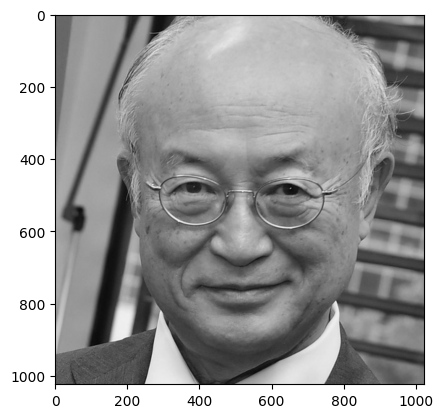

Running inference for /content/Skin-5/valid/01797_png.rf.1dde09aa47a1804ba60f8a254e4ce236.jpg... Done


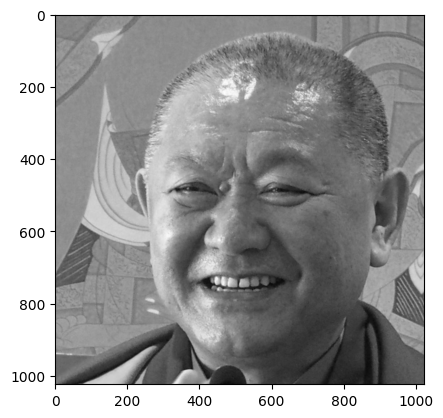

Running inference for /content/Skin-5/valid/03567_png.rf.95d1bceca5c5b67486aaab799e4617ca.jpg... Done


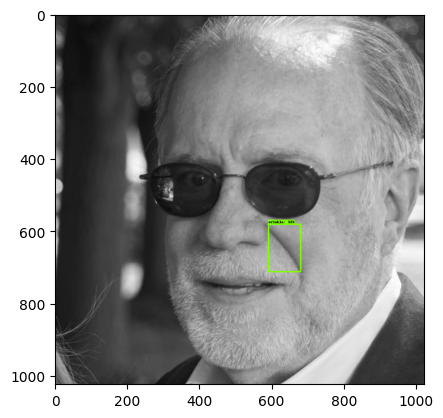

Running inference for /content/Skin-5/valid/118_jpg.rf.5c0b62964a89e28a1e41d28a7072d792.jpg... Done


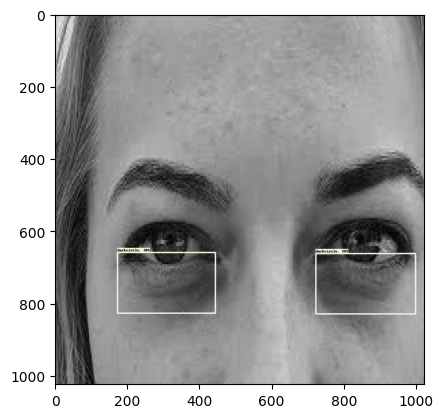

Running inference for /content/Skin-5/valid/18588_png.rf.9ce886ca8317977707af0959147dcaa3.jpg... Done


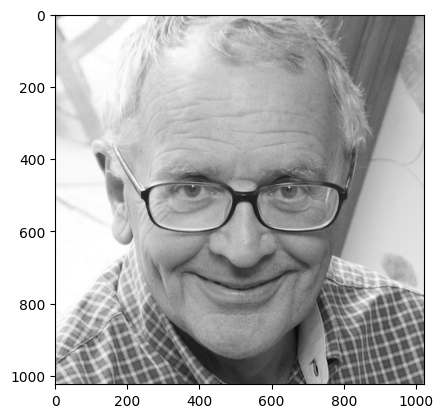

Running inference for /content/Skin-5/valid/01629_png.rf.6d65c7abc9355659a4a093ea4f08d897.jpg... Done


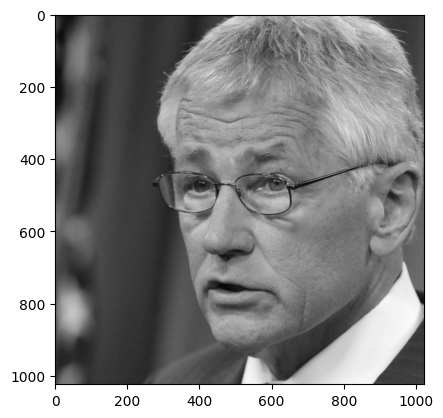

Running inference for /content/Skin-5/valid/2394089614_1_jpg.rf.20c95181b16db78186400f470eb2f3f0.jpg... Done


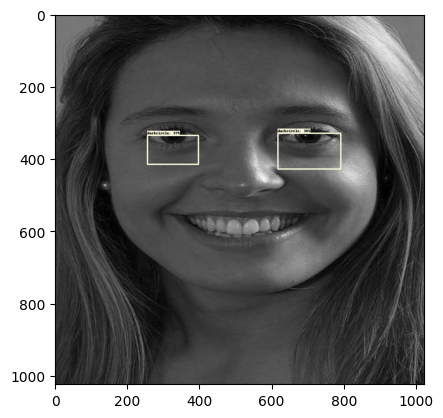

Running inference for /content/Skin-5/valid/15217_png.rf.a336c90cee935b3d535cc34d2519a037.jpg... Done


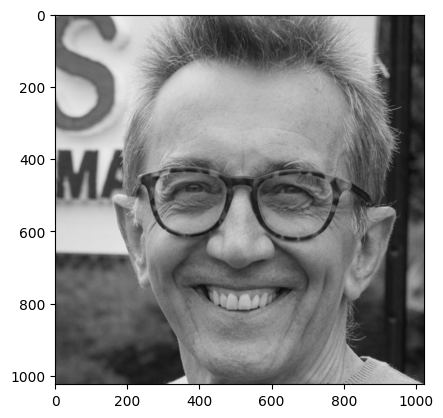

Running inference for /content/Skin-5/valid/2707641297_1_jpg.rf.75b49296e7a4aba806253e392a0664c3.jpg... Done


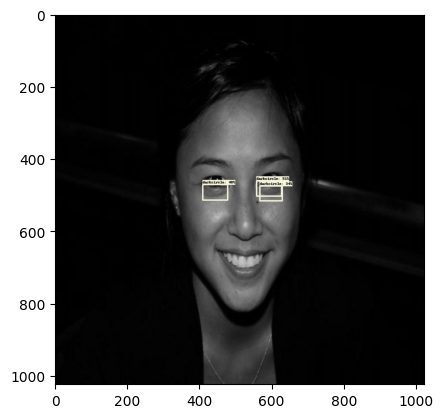

Running inference for /content/Skin-5/valid/07928_png.rf.08e5e13095e71f66f42a2da82a6f2cf7.jpg... Done


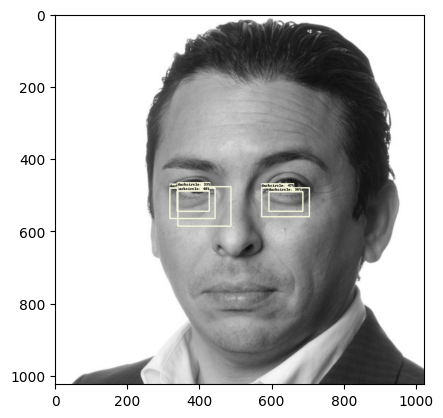

In [83]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
# warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

IMAGE_PATHS = [
    os.path.join(dir_path, file_name)
    for dir_path, _, file_names in os.walk('/content/Skin-5/valid/')
    for file_name in file_names
    if file_name.endswith('.jpg') or file_name.endswith('.png')
]

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


for image_path in IMAGE_PATHS[30:40]:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    image_np = np.tile(
        np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.3,
          agnostic_mode=False)

    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()

# sphinx_gallery_thumbnail_number = 2